In [1]:
import sys
import os
import numpy as np
import torch
import matplotlib.pyplot as plt

# Add src to path
sys.path.append(os.path.abspath(os.path.join(os.path.dirname('notebooks'), '..', 'ForceSMIP')))

# Import our modules
from data_loader import ForceSMIPDataLoader
from preprocessing import (
    yearly_average, compute_yearly_average_dict,
    merge_training_data, reshape_training_data, 
    apply_notnan_filter_complete, capture_nans
)
from algorithms import WeightedRidgeRegression, ridge_regression, LowRankSolver
from evaluation import ForceSMIPEvaluator, compute_trends_from_data, compute_statistics
from visualization import ForceSMIPVisualizer
from forcesmip_pipeline import ForceSMIPPipeline

# Set random seeds for reproducibility
np.random.seed(42)
torch.manual_seed(42)

print("Modules loaded successfully!")


Modules loaded successfully!


In [2]:
import sys, numpy as np
print("Notebook python:", sys.executable)
print("Python version:", sys.version)
print("NumPy version:", np.__version__)

Notebook python: /home/vcohen/.conda/envs/cope/bin/python
Python version: 3.10.18 | packaged by conda-forge | (main, Jun  4 2025, 14:45:41) [GCC 13.3.0]
NumPy version: 2.2.6


In [3]:
# Initialize pipeline
base_path = '/net/krypton/climdyn_nobackup/FTP'

# variable names:  tos, tas, pr, psl, mrso, siconc, monmaxtasmax
variable = 'mrso'  # Soil Moisture

pipeline = ForceSMIPPipeline(base_path, variable=variable)
print(f"Pipeline initialized for variable: {variable}")

Pipeline initialized for variable: mrso


In [4]:
# Initialize data loader
data_loader = ForceSMIPDataLoader(base_path)

# Load training data
print("Loading training data...")
dic_data, dic_forced_response, longitude, latitude = data_loader.load_training_data(variable)

print(f"Training data loaded:")
print(f"  Number of models: {len(dic_data)}")
print(f"  Model names: {list(dic_data.keys())}")
print(f"  Grid shape: {latitude.shape[0]} x {longitude.shape[0]}")
print(f"  Time steps: {list(dic_data.values())[0].shape[1]}")

Loading training data...
Processing 1/5: CESM2
  Processing 1/50: mrso_mon_CESM2_historical_ssp370_r1011.001i1p1f1.188001-210012.nc


/home/vcohen/cope/ForceSMIP/data_loader.py:107: RuntimeWarning: Mean of empty slice
  monthly_mean = np.nanmean(data_tmp[month_mask, :, :], axis=0).squeeze()


  Processing 2/50: mrso_mon_CESM2_historical_ssp370_r1031.002i1p1f1.188001-210012.nc
  Processing 3/50: mrso_mon_CESM2_historical_ssp370_r1051.003i1p1f1.188001-210012.nc
  Processing 4/50: mrso_mon_CESM2_historical_ssp370_r1071.004i1p1f1.188001-210012.nc
  Processing 5/50: mrso_mon_CESM2_historical_ssp370_r1091.005i1p1f1.188001-210012.nc
  Processing 6/50: mrso_mon_CESM2_historical_ssp370_r1111.006i1p1f1.188001-210012.nc
  Processing 7/50: mrso_mon_CESM2_historical_ssp370_r1131.007i1p1f1.188001-210012.nc
  Processing 8/50: mrso_mon_CESM2_historical_ssp370_r1151.008i1p1f1.188001-210012.nc
  Processing 9/50: mrso_mon_CESM2_historical_ssp370_r1171.009i1p1f1.188001-210012.nc
  Processing 10/50: mrso_mon_CESM2_historical_ssp370_r1191.010i1p1f1.188001-210012.nc
  Processing 11/50: mrso_mon_CESM2_historical_ssp370_r1231.011i1p1f1.188001-210012.nc
  Processing 12/50: mrso_mon_CESM2_historical_ssp370_r1231.012i1p1f1.188001-210012.nc
  Processing 13/50: mrso_mon_CESM2_historical_ssp370_r1231.013

/home/vcohen/cope/ForceSMIP/data_loader.py:111: RuntimeWarning: Mean of empty slice
  dic_forced_response[model_dir][:,:,:,:] = np.nanmean(dic_data[model_dir], axis=0)


Processing 2/5: CanESM5
  Processing 1/25: mrso_mon_CanESM5_historical_ssp585_r9i1p2f1.188001-210012.nc
  Processing 2/25: mrso_mon_CanESM5_historical_ssp585_r10i1p2f1.188001-210012.nc
  Processing 3/25: mrso_mon_CanESM5_historical_ssp585_r8i1p2f1.188001-210012.nc
  Processing 4/25: mrso_mon_CanESM5_historical_ssp585_r11i1p2f1.188001-210012.nc
  Processing 5/25: mrso_mon_CanESM5_historical_ssp585_r12i1p2f1.188001-210012.nc
  Processing 6/25: mrso_mon_CanESM5_historical_ssp585_r13i1p2f1.188001-210012.nc
  Processing 7/25: mrso_mon_CanESM5_historical_ssp585_r14i1p2f1.188001-210012.nc
  Processing 8/25: mrso_mon_CanESM5_historical_ssp585_r15i1p2f1.188001-210012.nc
  Processing 9/25: mrso_mon_CanESM5_historical_ssp585_r16i1p2f1.188001-210012.nc
  Processing 10/25: mrso_mon_CanESM5_historical_ssp585_r17i1p2f1.188001-210012.nc
  Processing 11/25: mrso_mon_CanESM5_historical_ssp585_r18i1p2f1.188001-210012.nc
  Processing 12/25: mrso_mon_CanESM5_historical_ssp585_r19i1p2f1.188001-210012.nc
  P

In [5]:
# Load test data
tier_set = 3
test_models = ['3A', '3B', '3C', '3D', '3E', '3F', '3G', '3H', '3I', '3J', '3K', '3L', '3M', '3N', '3O', '3P', '3Q', '3R', '3S', '3T','3U']
print("\nLoading test data...")
data_test, temporal_means = data_loader.load_test_data(variable, tier=f'Tier{tier_set}', test_models=test_models)


print(f"Test data shape: {data_test.shape}")


Loading test data...
Files in test data directory: ['mrso_mon_3A.197901-202312.nc', 'mrso_mon_3B.197901-202312.nc', 'mrso_mon_3C.197901-202312.nc', 'mrso_mon_3D.197901-202312.nc', 'mrso_mon_3E.197901-202312.nc', 'mrso_mon_3F.197901-202312.nc', 'mrso_mon_3G.197901-202312.nc', 'mrso_mon_3H.197901-202312.nc', 'mrso_mon_3I.197901-202312.nc', 'mrso_mon_3J.197901-202312.nc', 'mrso_mon_3K.197901-202312.nc', 'mrso_mon_3L.197901-202312.nc', 'mrso_mon_3M.197901-202312.nc', 'mrso_mon_3N.197901-202312.nc', 'mrso_mon_3O.197901-202312.nc', 'mrso_mon_3P.197901-202312.nc', 'mrso_mon_3Q.197901-202312.nc', 'mrso_mon_3R.197901-202312.nc', 'mrso_mon_3S.197901-202312.nc', 'mrso_mon_3T.197901-202312.nc', 'mrso_mon_3U.197901-202312.nc']
Loading test data for 3A at index 0
create data_test array
Monthly centering
Loading test data for 3B at index 1
Monthly centering
Loading test data for 3C at index 2
Monthly centering
Loading test data for 3D at index 3


/home/vcohen/cope/ForceSMIP/data_loader.py:179: RuntimeWarning: Mean of empty slice
  monthly_mean = np.nanmean(data_tmp[month_mask, :, :], axis=0).squeeze()


Monthly centering
Loading test data for 3E at index 4
Monthly centering
Loading test data for 3F at index 5
Monthly centering
Loading test data for 3G at index 6
Monthly centering
Loading test data for 3H at index 7
Monthly centering
Loading test data for 3I at index 8
Monthly centering
Loading test data for 3J at index 9
Monthly centering
Loading test data for 3K at index 10
Monthly centering
Loading test data for 3L at index 11
Monthly centering
Loading test data for 3M at index 12
Monthly centering
Loading test data for 3N at index 13
Monthly centering
Loading test data for 3O at index 14
Monthly centering
Loading test data for 3P at index 15
Monthly centering
Loading test data for 3Q at index 16
Monthly centering
Loading test data for 3R at index 17
Monthly centering
Loading test data for 3S at index 18
Monthly centering
Loading test data for 3T at index 19
Monthly centering
Loading test data for 3U at index 20
Monthly centering
Test data shape: (21, 540, 72, 144)


# Data processing

In [6]:
# Compute yearly averages
print("Computing yearly averages...")
dic_data_yearly = compute_yearly_average_dict(dic_data)
dic_forced_response_yearly = compute_yearly_average_dict(dic_forced_response)

data_test_yearly = yearly_average(data_test)


print(f"Yearly data shape (first model): {list(dic_data_yearly.values())[0].shape}")
print(f"Test yearly shape: {data_test_yearly.shape}")

Computing yearly averages...


Yearly data shape (first model): (50, 221, 72, 144)
Test yearly shape: (21, 45, 72, 144)


In [7]:
# Prepare training data for machine learning
print("Preparing training data...")

# Method 1: Merge all training data
x_train_merged, y_train_merged = merge_training_data(
    dic_data_yearly, dic_forced_response_yearly
)

# Method 2: Keep model separation
x_train_dict, y_train_dict = reshape_training_data(
    dic_data_yearly, dic_forced_response_yearly
)

print(f"Merged training data shape: X={x_train_merged.shape}, Y={y_train_merged.shape}")
print(f"Separated training data: {len(x_train_dict)} models")

Preparing training data...
Merged training data shape: X=torch.Size([40885, 10368]), Y=torch.Size([40885, 10368])
Separated training data: 5 models


# Capture the NaNs of the data

In [8]:
nan_idx, notnan_idx =capture_nans(x_train_dict)

# Prepare test data for smoothing experiments
x_test = torch.from_numpy(data_test.reshape(
    data_test.shape[0], data_test.shape[1], -1
)).to(torch.float32)

print(f"Test data shape for smoothing: {x_test.shape}")

False
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
False
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
False
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
False
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False

In [9]:
# add the nans that are also included in the test data
# record nan indices as the union of nans on each map
nan_idx_test = nan_idx.copy()

for idx_r in range(x_test.shape[0]):

    # get nan mask of test set 
    nan_mask = np.where(np.abs(x_test[idx_r,:,:])>1e10, True, False)
    if nan_mask.any() == False:
        nan_mask = np.where(np.isnan(x_test[idx_r,:,:])==True, True, False)

    # get the index of columns where there is at least one True in the nan mask
    col_indices = np.where(np.any(nan_mask, axis=0))[0]

    nan_idx_test = list(set(nan_idx_test) | set(col_indices))    

# define not nan indices (useful to ease the computations)
notnan_idx_test = list(set(list(range(x_test.shape[2]))) - set(nan_idx_test))
    

# # replace the nan index by Nans
# if variable != 'tas':
#     notnan_idx = notnan_idx_test
#     nan_idx = nan_idx_test


/tmp/ipykernel_39186/3740328616.py:8: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  nan_mask = np.where(np.abs(x_test[idx_r,:,:])>1e10, True, False)
/tmp/ipykernel_39186/3740328616.py:10: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  nan_mask = np.where(np.isnan(x_test[idx_r,:,:])==True, True, False)


In [10]:
# Apply not-NaN filter to all data
x_train_merged_filtered, y_train_merged_filtered, \
x_train_dict_filtered, y_train_dict_filtered, x_test_filtered = apply_notnan_filter_complete(
    x_train_merged, y_train_merged,
    x_train_dict, y_train_dict,
    x_test, notnan_idx
)

              APPLYING NOT-NAN FILTER TO ALL DATA
Valid indices count: 10346

1. Filtering merged training data...
   X: torch.Size([40885, 10368]) -> torch.Size([40885, 10346])
   Y: torch.Size([40885, 10368]) -> torch.Size([40885, 10346])

2. Filtering training dictionaries...
Filtering training dictionaries...
Keeping 10346 valid spatial features
torch.Size([50, 221, 10368])
CESM2: X torch.Size([50, 221, 10368]) -> torch.Size([50, 221, 10346])
torch.Size([25, 221, 10368])
CanESM5: X torch.Size([25, 221, 10368]) -> torch.Size([25, 221, 10346])
torch.Size([30, 221, 10368])
MIROC-ES2L: X torch.Size([30, 221, 10368]) -> torch.Size([30, 221, 10346])
torch.Size([50, 221, 10368])
MIROC6: X torch.Size([50, 221, 10368]) -> torch.Size([50, 221, 10346])
torch.Size([30, 221, 10368])
MPI-ESM1-2-LR: X torch.Size([30, 221, 10368]) -> torch.Size([30, 221, 10346])

3. Filtering test data...
   Test: torch.Size([21, 540, 10368]) -> torch.Size([21, 540, 10346])

=== FILTERING SUMMARY ===
Original spat

In [23]:
x_train_merged_filtered

tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])

# Run the ridge regression model

In [11]:
# build a weight matrix (latitude, longitude) where each grid cell is weighted by its surface area
weights = np.cos(np.radians(latitude))

# duplicate weights for each longitude
surface = torch.from_numpy(np.tile(weights[:, np.newaxis], (1, longitude.shape[0]))).to(torch.float32).flatten()
surface = surface[notnan_idx_test]

# Updated cell for model training
# Train global ridge regression model
lambda_reg = 10000.0
# print(f"Training ridge regression with lambda={lambda_reg}...")

w_ridge = ridge_regression(x_train_merged_filtered,y_train_merged_filtered, lambda_reg, surface=None, verbose=True)
# print(f"Ridge weights shape: {w_ridge.shape}")

Solving ridge regression with λ=10000.0
Input shape: X=torch.Size([40885, 10346]), Y=torch.Size([40885, 10346])
Reshaped: X=torch.Size([40885, 10346]), Y=torch.Size([40885, 10346])
Ridge weights computed: torch.Size([10346, 10346])


In [12]:
# Setup low-rank solver for efficient multiple rank solutions
print(f"\nSetting up low-rank solver...")
lr_solver = LowRankSolver()
lr_solver.fit(x_train_merged_filtered, y_train_merged_filtered, lambda_reg=lambda_reg, surface=None, verbose=True)

# Get solutions for multiple ranks efficiently
ranks_to_test = [5, 10, 15, 20, 25, 30, 50]
rank_solutions = lr_solver.get_multiple_ranks(ranks_to_test, verbose=True)

# Print explained variance for different ranks
print(f"\nExplained variance by rank:")
cumulative_var = lr_solver.cumulative_variance_ratio()
for rank in ranks_to_test:
    if rank <= len(cumulative_var):
        print(f"  Rank {rank}: {cumulative_var[rank-1]:.4f}")

# Use the primary rank solution
primary_rank = 30
w_ridge_lr = rank_solutions[primary_rank]
print(f"Primary rank-{primary_rank} weights shape: {w_ridge_lr.shape}")


Setting up low-rank solver...
Computing SVD for low-rank approximations...
Solving ridge regression with λ=10000.0
Input shape: X=torch.Size([40885, 10346]), Y=torch.Size([40885, 10346])
Reshaped: X=torch.Size([40885, 10346]), Y=torch.Size([40885, 10346])
Ridge weights computed: torch.Size([10346, 10346])
SVD computed: U=torch.Size([51231, 10346]), S=torch.Size([10346]), Vt=torch.Size([10346, 10346])
Singular values range: 0.000047 to 84787.421875
Computed solutions for ranks: [5, 10, 15, 20, 25, 30, 50]

Explained variance by rank:
  Rank 5: 0.8974
  Rank 10: 0.9727
  Rank 15: 0.9899
  Rank 20: 0.9951
  Rank 25: 0.9973
  Rank 30: 0.9982
  Rank 50: 0.9994
Primary rank-30 weights shape: torch.Size([10346, 10346])


In [13]:
x_test_filtered

tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        ...,

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0., 

### Smoothing

In [14]:
# # do some smoothing
from preprocessing import moving_average_smoothing

####### If it is tas variabe, then set the values > 1e9 to 0.0 ######
if variable == 'tas' or variable == 'pr':
    x_test_filtered[np.abs(x_test_filtered)>1e9] = 0.0
    x_test_filtered[np.isnan(x_test_filtered)==True] = 0.0

x_test_smooth = moving_average_smoothing(x_test_filtered, window_size=12*20, mode='same')

In [22]:
x_test_filtered

tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        ...,

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0., 

In [15]:
# Make predictions using different methods
print("Making predictions...")

# Global models
y_pred_ridge = x_test_filtered @ w_ridge
y_pred_ridge_lr = x_test_filtered @ w_ridge_lr

y_pred_ridge_smooth = x_test_smooth @ w_ridge
y_pred_ridge_lr_smooth = x_test_smooth @ w_ridge_lr

Making predictions...


In [16]:
y_pred_ridge_fullmap = torch.zeros((x_test.shape[0], x_test.shape[1], x_test.shape[2]))
y_pred_ridge_fullmap[:, :, notnan_idx] = y_pred_ridge
y_pred_ridge_fullmap[:, :, nan_idx] = float('nan')

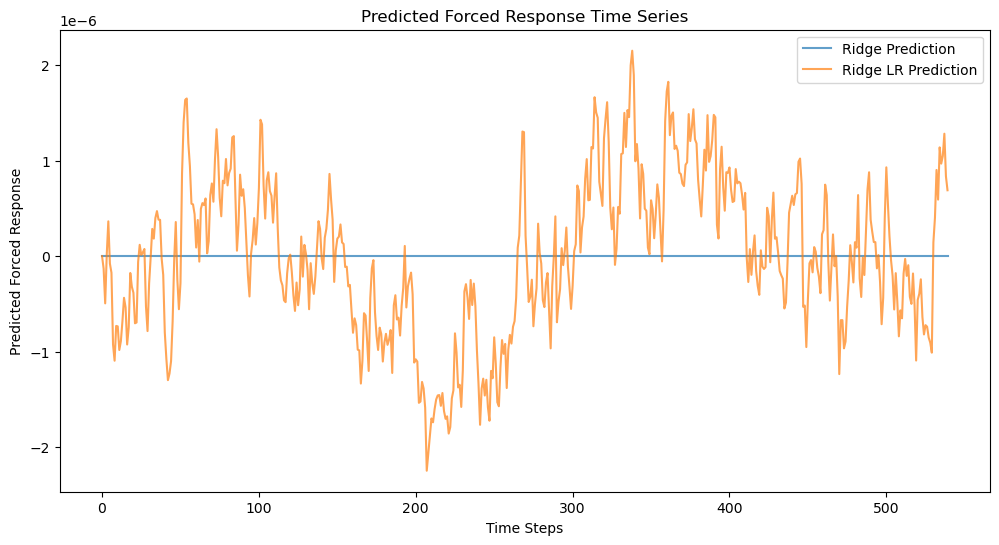

In [17]:
# display some time series of the predictions
# --- IGNORE ---
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(y_pred_ridge[0,:, 0].numpy(), label='Ridge Prediction', alpha=0.7)
plt.plot(y_pred_ridge_lr[0,:, 0].numpy(), label='Ridge LR Prediction', alpha=0.7)
plt.xlabel('Time Steps')
plt.ylabel('Predicted Forced Response')
plt.title('Predicted Forced Response Time Series')
plt.legend()
plt.show()

In [18]:
# Initialize evaluator
evaluator = ForceSMIPEvaluator()

# Convert predictions to yearly averages and compute trends
def to_yearly_and_trends(pred_data, trend_years=slice(30, None)):
    """Helper function to convert monthly to yearly and compute trends."""
    pred_numpy = pred_data.cpu().numpy() if isinstance(pred_data, torch.Tensor) else pred_data
    pred_yearly = np.reshape(pred_numpy, (pred_numpy.shape[0], pred_numpy.shape[1] // 12, 12, pred_numpy.shape[2]))
    print(f"Pred yearly shape (before mean): {pred_yearly.shape}")
    pred_yearly = np.nanmean(pred_yearly, axis=2)
    return compute_trends_from_data(pred_yearly, trend_years)

# Compute trends for all predictions
trend_years = slice(0, None)  # Last 43 years for trend computation


# trends_ground_truth = compute_trends_from_data(data_ground_truth_yearly, trend_years)
trends_ridge = to_yearly_and_trends(y_pred_ridge, trend_years)
trends_ridge_smooth = to_yearly_and_trends(y_pred_ridge_smooth, trend_years)
trends_ridge_lr = to_yearly_and_trends(y_pred_ridge_lr, trend_years)
trends_ridge_lr_smooth = to_yearly_and_trends(y_pred_ridge_lr_smooth, trend_years)


print(f"Trend shape: {trends_ridge.shape}")

Pred yearly shape (before mean): (21, 45, 12, 10346)


/tmp/ipykernel_39186/106182785.py:10: RuntimeWarning: Mean of empty slice
  pred_yearly = np.nanmean(pred_yearly, axis=2)


Pred yearly shape (before mean): (21, 45, 12, 10346)
Pred yearly shape (before mean): (21, 45, 12, 10346)
Pred yearly shape (before mean): (21, 45, 12, 10346)
Trend shape: (21, 10346)


# Visualization

In [19]:
# Initialize visualizer
visualizer = ForceSMIPVisualizer(longitude, latitude, test_models)

# reshape the trends for visualization
trends_ridge_fullmap = np.zeros((trends_ridge.shape[0], x_test.shape[2]), dtype=np.float32)
trends_ridge_fullmap[:,notnan_idx] = trends_ridge
trends_ridge_fullmap[:,nan_idx] = np.nan  # --- IGNORE ---
# trends_ridge_fullmap[:,nan_idx_test] = np.nan  # Fill NaNs for visualization

# reshape the trends for visualization
trends_ridge_smooth_fullmap = np.zeros((trends_ridge.shape[0], x_test.shape[2]), dtype=np.float32)
trends_ridge_smooth_fullmap[:,notnan_idx] = trends_ridge_smooth
trends_ridge_smooth_fullmap[:,nan_idx] = np.nan  # --- IGNORE ---
# trends_ridge_smooth_fullmap[:,nan_idx_test] = np.nan  # Fill NaNs for visualization


trends_ridge_lr_fullmap = np.zeros((trends_ridge_lr.shape[0], x_test.shape[2]), dtype=np.float32)
trends_ridge_lr_fullmap[:,notnan_idx] = trends_ridge_lr
trends_ridge_lr_fullmap[:,nan_idx] = np.nan  # --- IGNORE ---
# trends_ridge_lr_fullmap[:,nan_idx_test] = np.nan  # Fill NaNs for visualization

trends_ridge_lr_smooth_fullmap = np.zeros((trends_ridge_lr.shape[0], x_test.shape[2]), dtype=np.float32)
trends_ridge_lr_smooth_fullmap[:,notnan_idx] = trends_ridge_lr_smooth
trends_ridge_lr_smooth_fullmap[:,nan_idx] = np.nan  # --- IGNORE ---
# trends_ridge_lr_smooth_fullmap[:,nan_idx_test] = np.nan


In [21]:
trends_ridge_lr_fullmap

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]],
      shape=(21, 10368), dtype=float32)

Using vmin=nan, vmax=nan for colorbar


/home/vcohen/cope/ForceSMIP/visualization.py:113: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(np.abs(trend_2d))


ValueError: lower_level and upper_level cannot be NaN

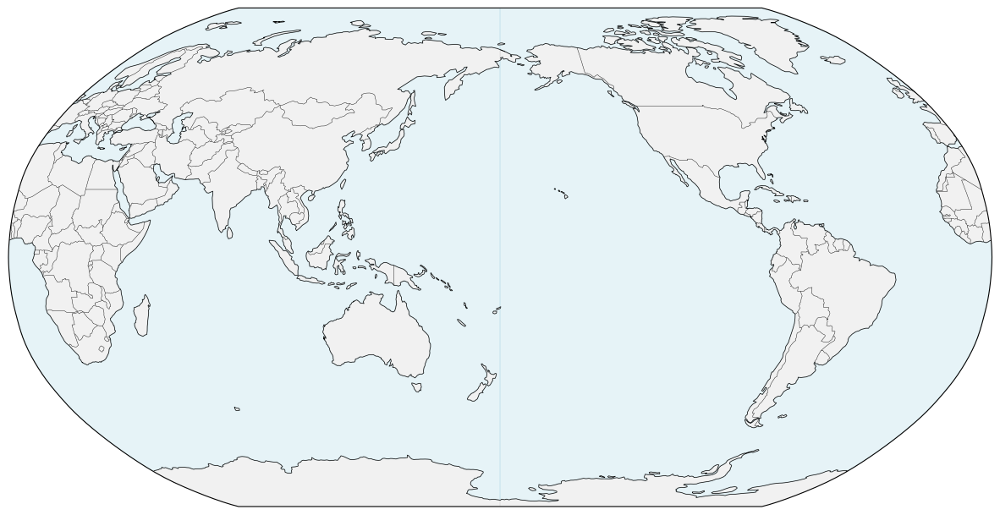

In [20]:
# display the trend map for the first test model
for idx_run in range(trends_ridge_smooth_fullmap.shape[0]):
    fig = visualizer.plot_robinson_projection(trends_ridge_fullmap, 
                                    title="Global Precipitation Trend",
                                    cmap='RdBu_r',
                                    run_idx=idx_run,
                                    central_longitude=180)

In [ ]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# from index to coordinate (latitude, longitude)
def index_to_latlon(idx):
    lat_idx = idx // longitude.shape[0]
    lon_idx = idx %  longitude.shape[0]
    return lat_idx, lon_idx

def plot_robinson_projection_weight_matrix(weight_matrix: np.ndarray, 
                                title: str = "Global Temperature Trend",
                                cmap: str = 'RdBu_r', 
                                vmin: float = None, 
                                vmax: float = None,
                                feat_idx: int = 0, 
                                central_longitude: float = 180) -> plt.Figure:
        """
        Plot data using Robinson projection.
        
        Args:
            trend_data: Trend data array of shape (n_runs, n_grid_points)
            title: Plot title
            cmap: Colormap name
            vmin, vmax: Color scale limits
            run_idx: Which run to plot
            central_longitude: Longitude to center projection (180 for Pacific)
            
        Returns:
            Matplotlib figure
        """
        # Reshape trend data to 2D grid
        weight_2d = weight_matrix[feat_idx, :].reshape(latitude.shape[0], longitude.shape[0])
        
        # Create meshgrid for plotting
        lon_2d, lat_2d = np.meshgrid(longitude, latitude)
        
        # Set color limits if not provided
        if vmin is None or vmax is None:
            vmax = np.nanmax(np.abs(weight_2d))
            vmin = -vmax

        print(f"Using vmin={vmin}, vmax={vmax} for colorbar")
        
        # Create figure with Robinson projection
        fig = plt.figure(figsize=(15, 8))
        ax = fig.add_subplot(111, projection=ccrs.Robinson(central_longitude=central_longitude))
        
        ax.set_global()
        ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
        ax.add_feature(cfeature.BORDERS, linewidth=0.3)
        ax.add_feature(cfeature.OCEAN, color='lightblue', alpha=0.3)
        ax.add_feature(cfeature.LAND, color='lightgray', alpha=0.3)
        
        # Plot the data
        levels = np.linspace(vmin, vmax, 20)
        im = ax.contourf(lon_2d, lat_2d, weight_2d,
                        levels, cmap=cmap,
                        transform=ccrs.PlateCarree(), extend='both')

        # highlight the location of idx_feat using a cross in the robinson projection

        lat_idx, lon_idx = index_to_latlon(feat_idx)
        print(f"Feature index {feat_idx} corresponds to lat index {lat_idx}, lon index {lon_idx}")
        print(f"Feature coordinates: Latitude {latitude[lat_idx]}, Longitude {longitude[lon_idx]}")


        ax.plot(longitude[lon_idx], latitude[lat_idx], 'kx',transform=ccrs.PlateCarree(), markersize=30, markeredgewidth=2)

        # lat_idx, lon_idx = index_to_latlon(feat_idx, (latitude.shape[0], longitude.shape[0]))
        # ax.plot(longitude[lon_idx], latitude[lat_idx], 'ko', markersize=8, markerfacecolor='none', markeredgewidth=2,
        #         transform=ccrs.PlateCarree(), label='Feature Location')
        
        # Add gridlines
        gl = ax.gridlines(draw_labels=True, alpha=0.3)
        gl.top_labels = False
        gl.right_labels = False
        
        # Add colorbar
        cbar = plt.colorbar(im, ax=ax, orientation='horizontal',
                           pad=0.1, shrink=0.8, aspect=30)
        cbar.set_label('Temperature Trend (°C/year)', fontsize=12)
        
        projection_type = "Pacific Centered" if central_longitude == 180 else "Atlantic Centered"
        # plt.title(f'{title} - Model {self.test_model_names[run_idx]}\n(Robinson Projection - {projection_type})', fontsize=14, pad=20)
        plt.tight_layout()
        
        return fig

Using vmin=-0.0013733707601204515, vmax=0.0013733707601204515 for colorbar


Feature index 1000 corresponds to lat index 6, lon index 136
Feature coordinates: Latitude -73.75, Longitude 341.25
Using vmin=-0.00070589454844594, vmax=0.00070589454844594 for colorbar
Feature index 2000 corresponds to lat index 13, lon index 128
Feature coordinates: Latitude -56.25, Longitude 321.25
Using vmin=-0.0011117422254756093, vmax=0.0011117422254756093 for colorbar
Feature index 3000 corresponds to lat index 20, lon index 120
Feature coordinates: Latitude -38.75, Longitude 301.25
Using vmin=-0.00020142595167271793, vmax=0.00020142595167271793 for colorbar
Feature index 4000 corresponds to lat index 27, lon index 112
Feature coordinates: Latitude -21.25, Longitude 281.25
Using vmin=-0.005296424496918917, vmax=0.005296424496918917 for colorbar
Feature index 5000 corresponds to lat index 34, lon index 104
Feature coordinates: Latitude -3.75, Longitude 261.25
Using vmin=-0.0020834924653172493, vmax=0.0020834924653172493 for colorbar
Feature index 6000 corresponds to lat index 41

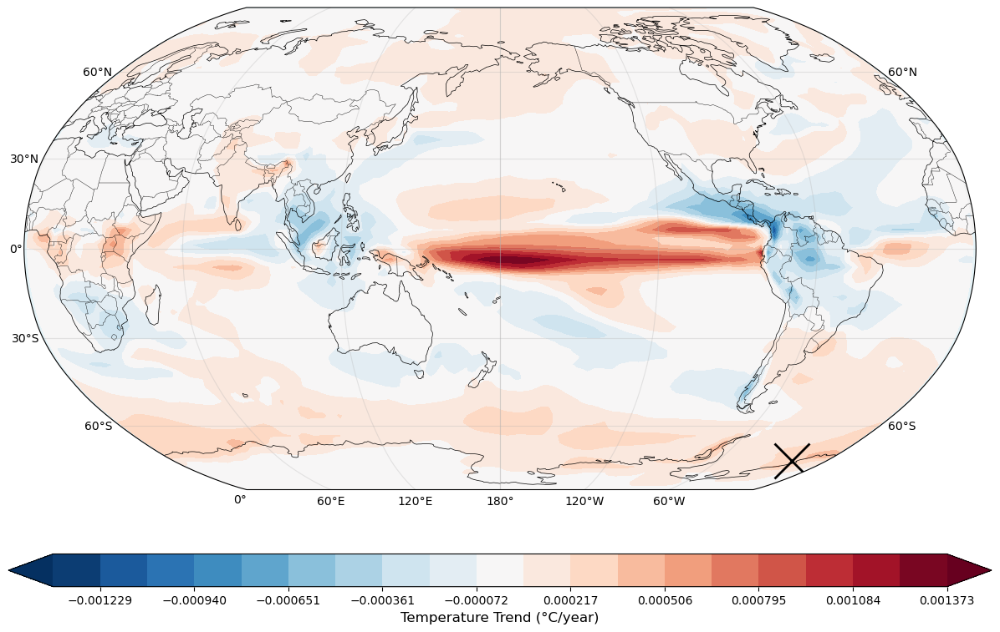

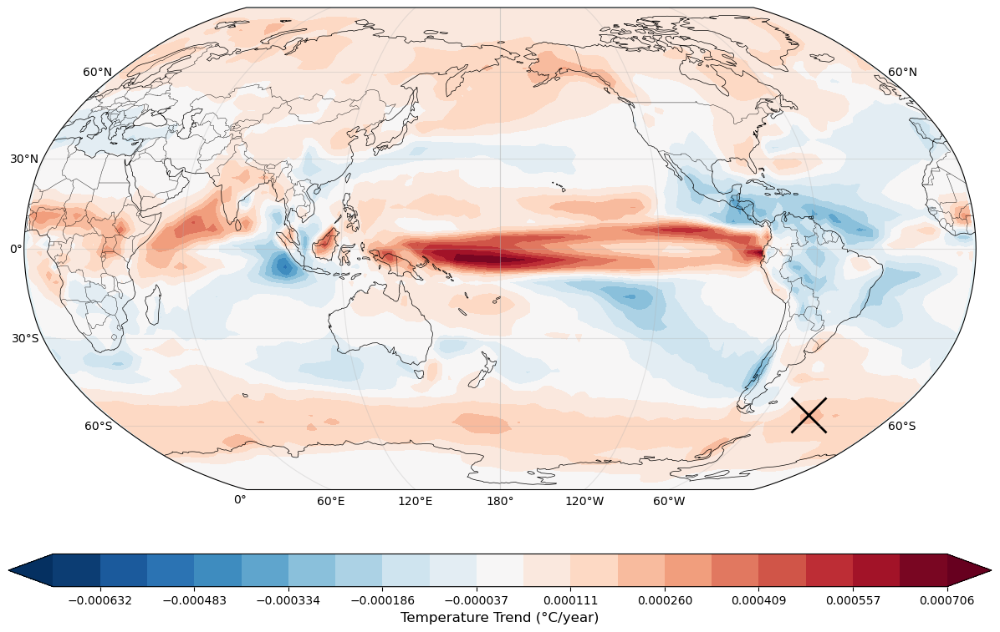

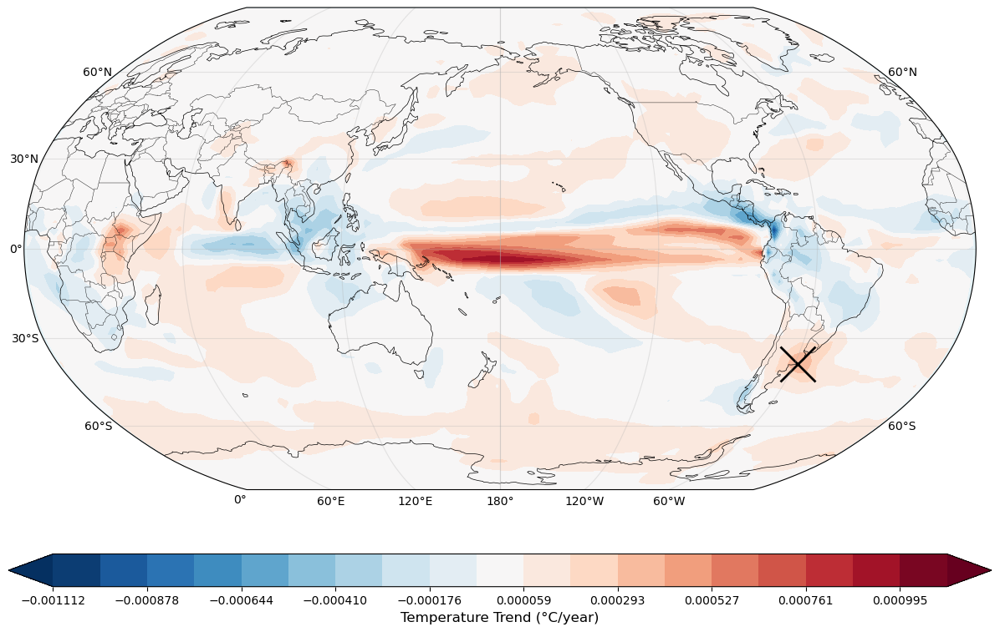

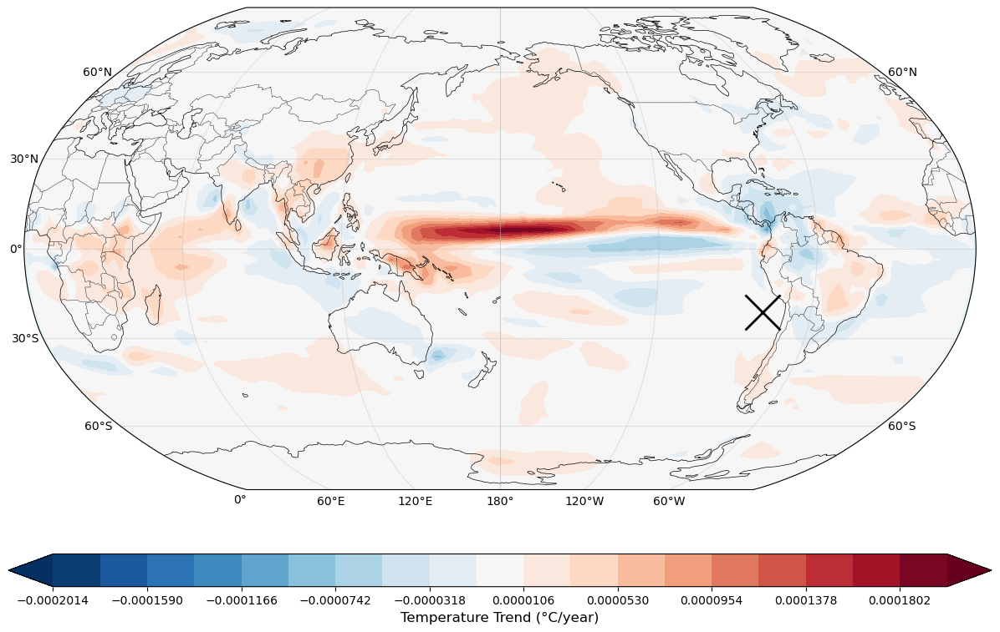

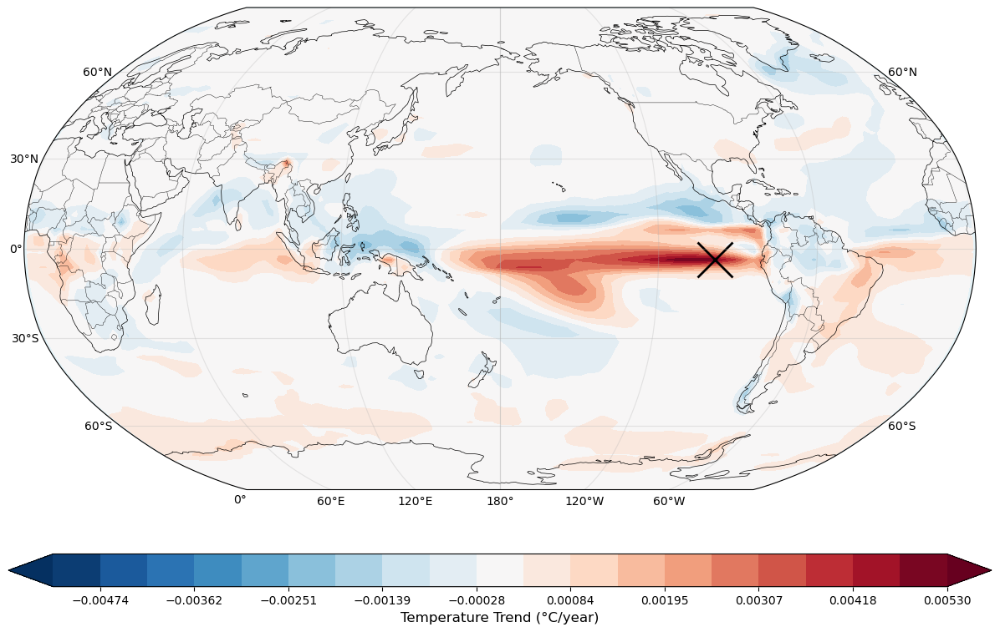

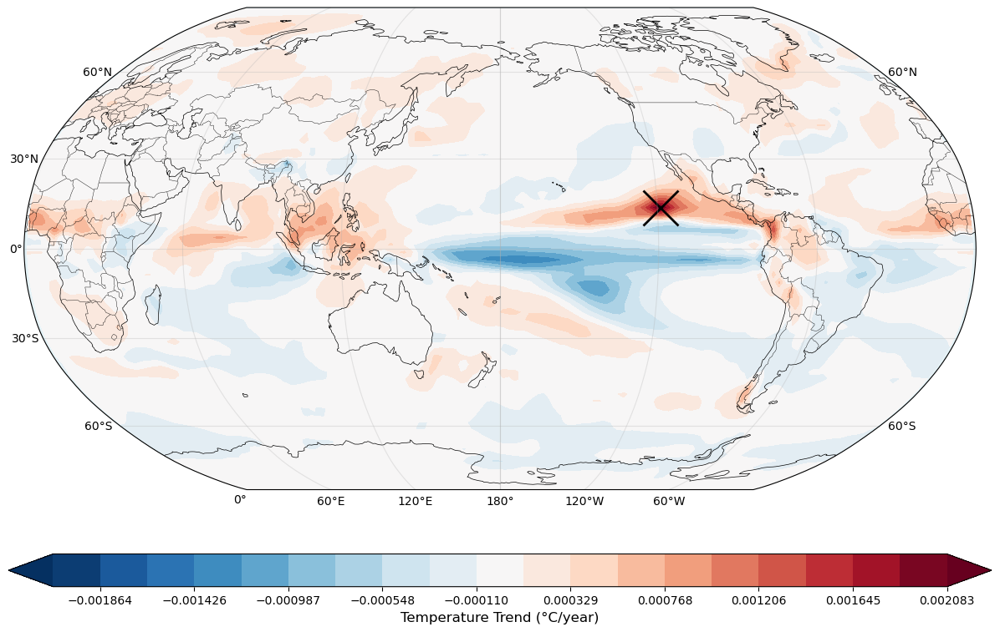

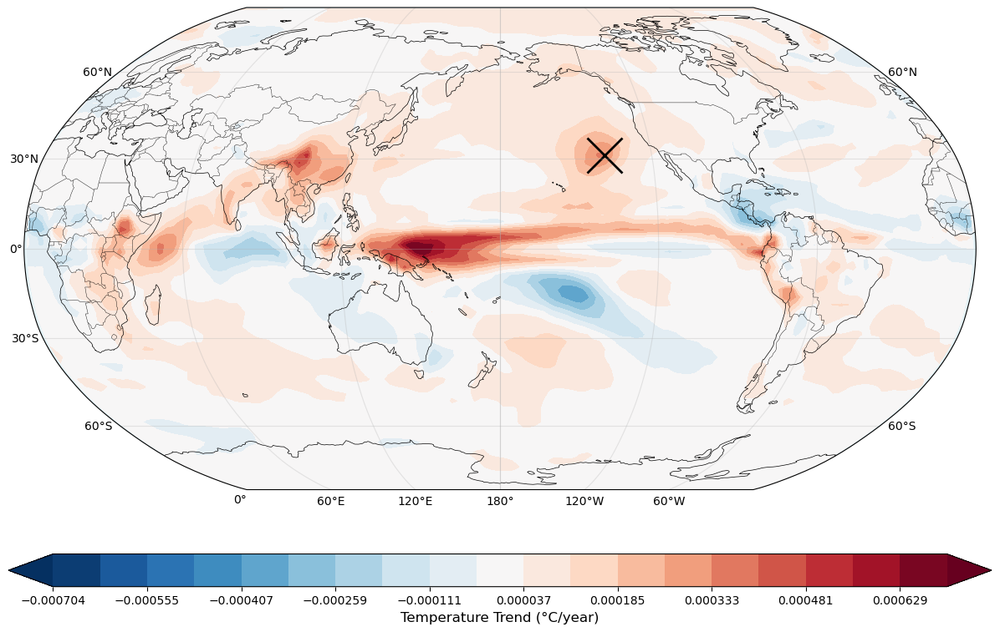

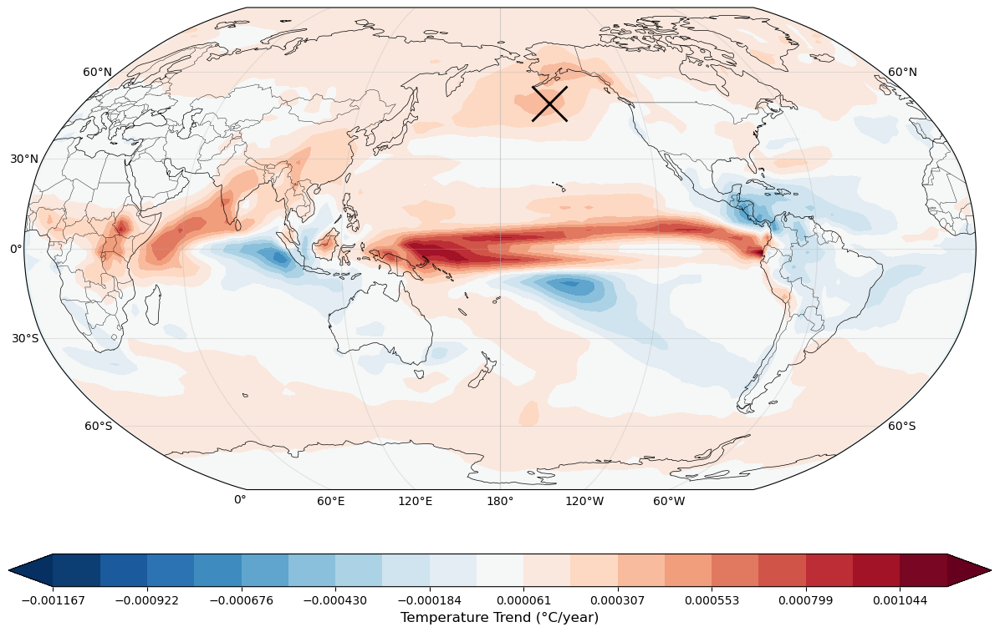

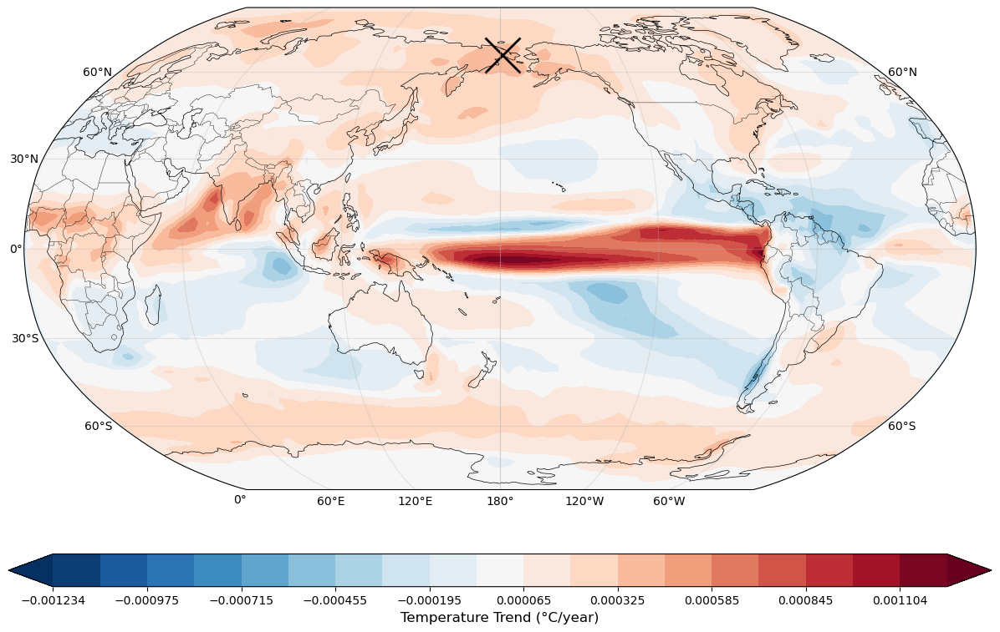

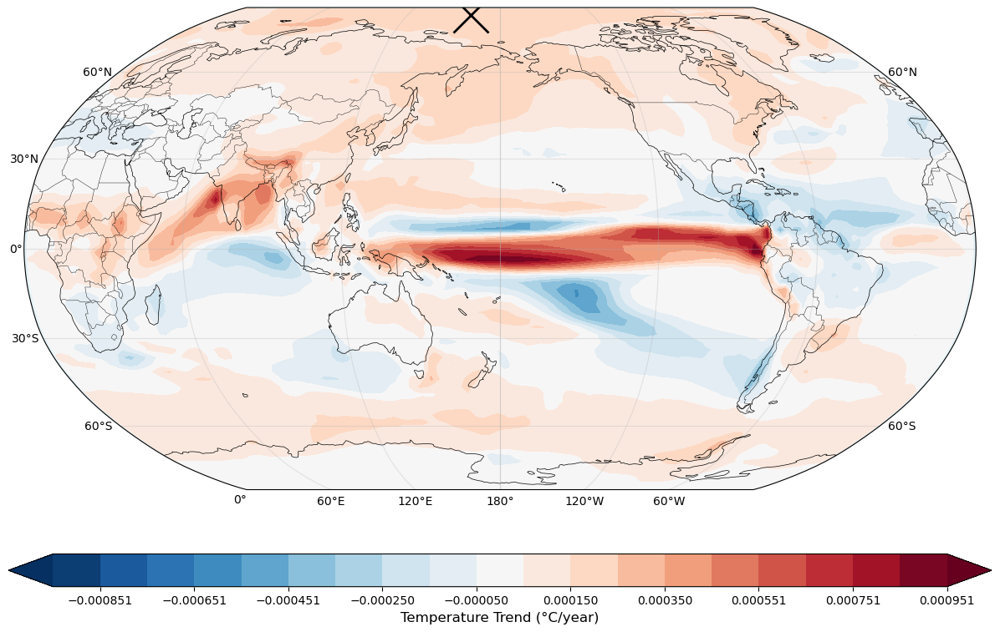

In [ ]:
# display some rows of w_ridge_fullmap and higlight the gridcell of interest (idx_feat)
# reshape the trends for visualization
w_ridge_fullmap = np.zeros((w_ridge.shape[0], x_test.shape[2]), dtype=np.float32)
w_ridge_fullmap[:,notnan_idx] = w_ridge 
w_ridge_fullmap[:,nan_idx] = np.nan  # Fill NaNs for visualization


for feat_idx in [1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]:
    fig = plot_robinson_projection_weight_matrix(w_ridge_fullmap, 
                                    title= "Global Temperature Trend",
                                    cmap= 'RdBu_r', 
                                    feat_idx = feat_idx, 
                                    central_longitude = 180)
    # plt.show()

## Cross validation to select the best combination (ridge penalty param, rank)

         CROSS-VALIDATION LAMBDA OPTIMIZATION
Performing cross-validation to optimize lambda for worst-case performance...
Cross-validation with 5 folds for 1 lambda values...
Optimization objective: worst_case
  Testing λ = 10.0


    Mean NRMSE: 0.6430
   Q75 NRMSE: 0.6699
   Q90 NRMSE: 0.6803
   Q95 NRMSE: 0.6837
    Worst NRMSE: 0.6872
    NRMSE Variance: 0.0021

Optimization complete!
Best λ = 10.0 (optimizing worst_nrmse)
Best worst_nrmse: 0.6872


/home/vcohen/cope/ForceSMIP/algorithms.py:882: UserWarning: Glyph 11088 (\N{WHITE MEDIUM STAR}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/vcohen/.conda/envs/cope/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 11088 (\N{WHITE MEDIUM STAR}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


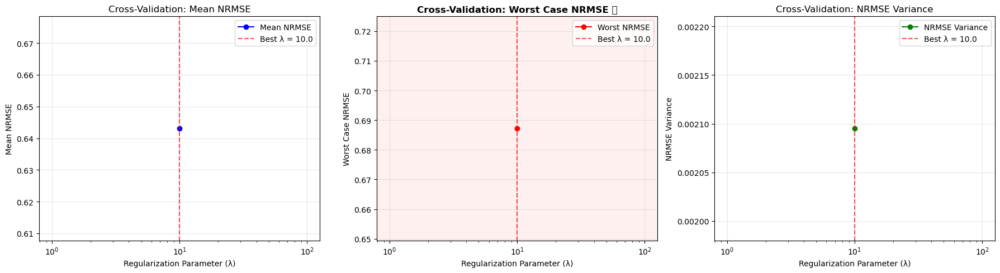


🎯 OPTIMAL LAMBDA (CV-optimized): 10.0
   Worst-case NRMSE: 0.6872
   Mean NRMSE: 0.6430


In [ ]:
## 6.5 Cross-Validation to get the best Lambda Optimization

print("="*70)
print("         CROSS-VALIDATION LAMBDA OPTIMIZATION")
print("="*70)

# Import the cross-validation function
from algorithms import cross_validation_lambda_optimization, cross_validation_lambda_rank_optimization,\
                        plot_cv_lambda_results, plot_cv_lambda_rank_results

# Define lambda values to test (broader range for better optimization)
lambda_values_cv = [10.0]


print("Performing cross-validation to optimize lambda for worst-case performance...")

# Optimize lambda using cross-validation with worst-case objective


cv_optimization = cross_validation_lambda_optimization(
    x_train_dict_filtered, y_train_dict_filtered,
    lambda_values=lambda_values_cv,
    cv_folds=5,
    objective='worst_case',  # Optimize for worst-case NRMSE
    verbose=True
)

# Plot cross-validation results
fig_cv = plot_cv_lambda_results(cv_optimization, figsize=(18, 5))
plt.show()


# Extract optimal lambda
optimal_lambda_cv = cv_optimization['best_lambda']
print(f"\n🎯 OPTIMAL LAMBDA (CV-optimized): {optimal_lambda_cv}")
print(f"   Worst-case NRMSE: {cv_optimization['cv_results'][optimal_lambda_cv]['worst_nrmse']:.4f}")
print(f"   Mean NRMSE: {cv_optimization['cv_results'][optimal_lambda_cv]['mean_nrmse']:.4f}")

         CROSS-VALIDATION LAMBDA OPTIMIZATION
Performing cross-validation to optimize lambda and rank for worst-case performance...
Cross-validation with 5 folds for 1 lambda values...
Optimization objective: worst_case
  Testing λ = 10.0



Setting up low-rank solver...
Computing SVD for low-rank approximations...
Solving ridge regression with λ=10.0
Input shape: X=torch.Size([29835, 10368]), Y=torch.Size([29835, 10368])
Reshaped: X=torch.Size([29835, 10368]), Y=torch.Size([29835, 10368])
Ridge weights computed: torch.Size([10368, 10368])
SVD computed: U=torch.Size([40203, 10368]), S=torch.Size([10368]), Vt=torch.Size([10368, 10368])
Singular values range: 0.000000 to 606.574768
Computed solutions for ranks: [10]

Setting up low-rank solver...
Computing SVD for low-rank approximations...
Solving ridge regression with λ=10.0
Input shape: X=torch.Size([35360, 10368]), Y=torch.Size([35360, 10368])
Reshaped: X=torch.Size([35360, 10368]), Y=torch.Size([35360, 10368])
Ridge weights computed: torch.Size([10368, 10368])
SVD computed: U=torch.Size([45728, 10368]), S=torch.Size([10368]), Vt=torch.Size([10368, 10368])
Singular values range: 0.000000 to 451.348907
Computed solutions for ranks: [10]

Setting up low-rank solver...
Com

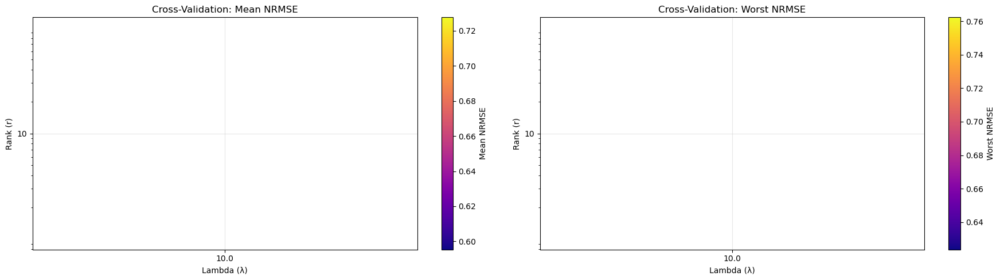


🎯 OPTIMAL LAMBDA (CV-optimized): 10.0
🎯 OPTIMAL RANK (CV-optimized): 10
   Worst-case NRMSE: 0.6930
   Mean NRMSE: 0.6615


In [ ]:
## 6.5 Cross-Validation Lambda Optimization
print("="*70)
print("         CROSS-VALIDATION LAMBDA OPTIMIZATION")
print("="*70)

# Define lambda values to test (broader range for better optimization)
lambda_values_cv = [10.0]
rank_values_cv = [10]




print("Performing cross-validation to optimize lambda and rank for worst-case performance...")

# Optimize lambda and rank using cross-validation with worst-case objective
cv_optimization_lr = cross_validation_lambda_rank_optimization(
    x_train_dict_filtered, y_train_dict_filtered,
    lambda_values=lambda_values_cv,
    rank_values=rank_values_cv,
    cv_folds=5,
    objective='worst_case',  # Optimize for worst-case NRMSE
    verbose=True
)

# # Plot cross-validation results
fig_cv = plot_cv_lambda_rank_results(cv_optimization_lr, figsize=(18, 5))
plt.show()

# Extract optimal lambda
optimal_lambda_cv_lr = cv_optimization_lr['best_lambda']
optimal_rank_cv_lr = cv_optimization_lr['best_rank']
print(f"\n🎯 OPTIMAL LAMBDA (CV-optimized): {optimal_lambda_cv_lr}")
print(f"🎯 OPTIMAL RANK (CV-optimized): {optimal_rank_cv_lr}")
print(f"   Worst-case NRMSE: {cv_optimization_lr['cv_results'][(optimal_lambda_cv_lr, optimal_rank_cv_lr)]['worst_nrmse']:.4f}")
print(f"   Mean NRMSE: {cv_optimization_lr['cv_results'][(optimal_lambda_cv_lr, optimal_rank_cv_lr)]['mean_nrmse']:.4f}")

In [ ]:
# optimal_lambda_cv_lr

In [ ]:
# given the best lambda value, run the ridge regression again
w_ridge_cv = ridge_regression(x_train_merged_filtered,y_train_merged_filtered, optimal_lambda_cv, verbose=True)


# given the best lambda and best rank, run the low-rank solver again
w_ridge_lr_cv =  ridge_regression(x_train_merged_filtered,y_train_merged_filtered, optimal_lambda_cv_lr, verbose=True)


# lr_solver_cv = LowRankSolver()
# lr_solver_cv.fit(x_train_merged_filtered, y_train_merged_filtered, w_ridge_lr_cv, verbose=True)
# lr_solver_cv_solution = lr_solver_cv.get_multiple_ranks([optimal_rank_cv_lr], verbose=True)

Solving ridge regression with λ=10.0
Input shape: X=torch.Size([40885, 10368]), Y=torch.Size([40885, 10368])
Reshaped: X=torch.Size([40885, 10368]), Y=torch.Size([40885, 10368])
Ridge weights computed: torch.Size([10368, 10368])
Solving ridge regression with λ=10.0
Input shape: X=torch.Size([40885, 10368]), Y=torch.Size([40885, 10368])
Reshaped: X=torch.Size([40885, 10368]), Y=torch.Size([40885, 10368])
Ridge weights computed: torch.Size([10368, 10368])


In [ ]:
# build the concatenation of (X, sqrt{lambda} I_p)
S_inv = torch.eye(x_train_merged_filtered.shape[1], dtype=x_train_merged_filtered.dtype, device=x_train_merged_filtered.device)

I_p = torch.eye(x_train_merged_filtered.shape[1], dtype=x_train_merged_filtered.dtype, device=x_train_merged_filtered.device)
x_augmented = torch.cat([x_train_merged_filtered, torch.sqrt(torch.tensor(optimal_lambda_cv_lr, dtype=x_train_merged_filtered.dtype, device=x_train_merged_filtered.device)) * I_p], dim=0)


In [ ]:
temporal_means = temporal_means.reshape(temporal_means.shape[0], temporal_means.shape[1], -1)
temporal_means = temporal_means[:,:,notnan_idx]

In [ ]:
U, S, Vt = torch.linalg.svd(x_augmented @ w_ridge_lr_cv, full_matrices=False)

In [ ]:
longitude.shape

(144,)

In [ ]:
# Make predictions using different methods
print("Making predictions...")
# Global models
y_pred_ridge = (x_test_filtered @ w_ridge + temporal_means).reshape(x_test.shape[0], x_test.shape[1], latitude.shape[0], longitude.shape[0])
y_pred_ridge_lr = (x_test_filtered @ w_ridge_lr + temporal_means).reshape(x_test.shape[0], x_test.shape[1], latitude.shape[0], longitude.shape[0])

y_pred_ridge_smooth = (x_test_smooth @ w_ridge + temporal_means).reshape(x_test.shape[0], x_test.shape[1], latitude.shape[0], longitude.shape[0])
y_pred_ridge_lr_smooth = (x_test_smooth @ w_ridge_lr + temporal_means).reshape(x_test.shape[0], x_test.shape[1], latitude.shape[0], longitude.shape[0])

Making predictions...


/tmp/ipykernel_36113/3659708686.py:4: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  y_pred_ridge = (x_test_filtered @ w_ridge + temporal_means).reshape(x_test.shape[0], x_test.shape[1], latitude.shape[0], longitude.shape[0])
/tmp/ipykernel_36113/3659708686.py:5: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  y_pred_ridge_lr = (x_test_filtered @ w_ridge_lr + temporal_means).reshape(x_test.shape[0], x_test.shape[1], latitude.shape[0], longitude.shape[0])
/tmp/ipykernel_36113/3659708686.py:7: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  y_pred_ridge_smooth = (x_test_smooth @ w_ridge + temporal_means).reshape(x_test.shape[0], x_test.shape[1], latitude.shape[0], longitude.shape[0])
/tmp/ipykernel_36113/3659708686.py:8: 

In [ ]:
# save the forced response predictions into a netcdf file

import xarray as xr
import pandas as pd

# convert numpy arrays to xarray DataArrays
def to_xarray(data, model_names, longitude, latitude):
    time = pd.date_range(start='1850-01-01', periods=data.shape[1], freq='ME')
    data_xr = xr.DataArray(
        data,
        dims=['model', 'time', 'latitude','longitude'],
        coords={
            'model': model_names,
            'time': time,
            'longitude': longitude,
            'latitude': latitude
        }
    )

    lon_xr = xr.DataArray(
        longitude,
        dims=['lon'],
        coords={'lon': longitude}
    )
    
    lat_xr = xr.DataArray(
        latitude,
        dims=['lat'],
        coords={'lat': latitude}
    )
    
    return data_xr, lon_xr, lat_xr



In [ ]:
# Convert to Dataset with a custom variable name
y_pred_ridge_xr, lon_xr, lat_xr = to_xarray(y_pred_ridge, test_models, longitude, latitude)
y_pred_ridge_xr.to_dataset(name='prediction').to_netcdf('/home/vcohen/cope/results/tier2/predictions_psl_ridge_tier2.nc')
y_pred_ridge_lr_xr, lon_xr, lat_xr = to_xarray(y_pred_ridge_lr, test_models, longitude, latitude)
y_pred_ridge_lr_xr.to_dataset(name='prediction').to_netcdf('/home/vcohen/cope/results/tier2/predictions_psl_ridge_lr_tier2.nc')

y_pred_ridge_smooth_xr, lon_xr, lat_xr = to_xarray(y_pred_ridge_smooth, test_models, longitude, latitude)
y_pred_ridge_smooth_xr.to_dataset(name='prediction').to_netcdf('/home/vcohen/cope/results/tier2/predictions_psl_ridge_smooth_tier2.nc')
y_pred_ridge_lr_smooth_xr, lon_xr, lat_xr = to_xarray(y_pred_ridge_lr_smooth, test_models, longitude, latitude)
y_pred_ridge_lr_smooth_xr.to_dataset(name='prediction').to_netcdf('/home/vcohen/cope/results/tier2/predictions_psl_ridge_lr_smooth_tier2.nc')

In [ ]:
y_pred_ridge_lr_xr.to_dataset(name='prediction')

<xarray.Dataset> Size: 470MB
Dimensions:     (model: 21, time: 540, longitude: 144, latitude: 72)
Coordinates:
  * model       (model) <U2 168B '3A' '3B' '3C' '3D' ... '3R' '3S' '3T' '3U'
  * time        (time) datetime64[ns] 4kB 1850-01-31 1850-02-28 ... 1894-12-31
  * longitude   (longitude) float64 1kB 1.25 3.75 6.25 ... 353.8 356.2 358.8
  * latitude    (latitude) float64 576B -88.75 -86.25 -83.75 ... 86.25 88.75
Data variables:
    prediction  (model, time, latitude, longitude) float32 470MB 0.1124 ... 0...

In [ ]:
# save it as a netcdf file
path_tier2 = '/home/vcohen/cope/results/tier2/'

y_pred_ridge_xr.to_netcdf(f'{path_tier2}predictions_{variable}_ridge_tier2.nc')
y_pred_ridge_lr_xr.to_netcdf(f'{path_tier2}predictions_{variable}_ridge_lr_tier2.nc')
y_pred_ridge_smooth_xr.to_netcdf(f'{path_tier2}predictions_{variable}_ridge_smooth_tier2.nc')
y_pred_ridge_lr_smooth_xr.to_netcdf(f'{path_tier2}predictions_{variable}_ridge_lr_smooth_tier2.nc')

In [ ]:
# read a netcdf file

import netCDF4 as nc

file_path = '/home/vcohen/cope/results/tier2/predictions_psl_ridge_tier2.nc'

with nc.Dataset(file_path, 'r') as nc_file:
    # print(nc_file.variables.keys())
    print(nc_file.variables['model'])
    data = np.array(nc_file.variables['__xarray_dataarray_variable__'])
    # time = np.array(nc_file.variables['time'])
    # data = np.array(nc_file.variables['ta'])




<class 'netCDF4.Variable'>
vlen model(model)
vlen data type: <class 'str'>
unlimited dimensions: 
current shape = (21,)


KeyError: '__xarray_dataarray_variable__'

In [ ]:
trends_ridge_tmp = to_yearly_and_trends(data, trend_years)

Pred yearly shape (before mean): (21, 124, 12, 10368)


In [ ]:
trends_ridge_fullmap = np.zeros((trends_ridge_tmp.shape[0], x_test.shape[2]), dtype=np.float32)
trends_ridge_fullmap = trends_ridge_tmp

Using vmin=-2.2071762084960938, vmax=2.2071762084960938 for colorbar
Using vmin=-2.193793535232544, vmax=2.193793535232544 for colorbar
Using vmin=-1.4962221384048462, vmax=1.4962221384048462 for colorbar
Using vmin=-1.2529387474060059, vmax=1.2529387474060059 for colorbar
Using vmin=-2.1163463592529297, vmax=2.1163463592529297 for colorbar
Using vmin=-1.7131619453430176, vmax=1.7131619453430176 for colorbar
Using vmin=-1.207153081893921, vmax=1.207153081893921 for colorbar
Using vmin=-1.642557978630066, vmax=1.642557978630066 for colorbar
Using vmin=-3.3295252323150635, vmax=3.3295252323150635 for colorbar
Using vmin=-1.6344184875488281, vmax=1.6344184875488281 for colorbar
Using vmin=-1.3184202909469604, vmax=1.3184202909469604 for colorbar
Using vmin=-9.751827239990234, vmax=9.751827239990234 for colorbar
Using vmin=-1.5815175771713257, vmax=1.5815175771713257 for colorbar
Using vmin=-1.827731728553772, vmax=1.827731728553772 for colorbar
Using vmin=-2.1045453548431396, vmax=2.10454

/home/vcohen/cope/ForceSMIP/visualization.py:119: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(15, 8))


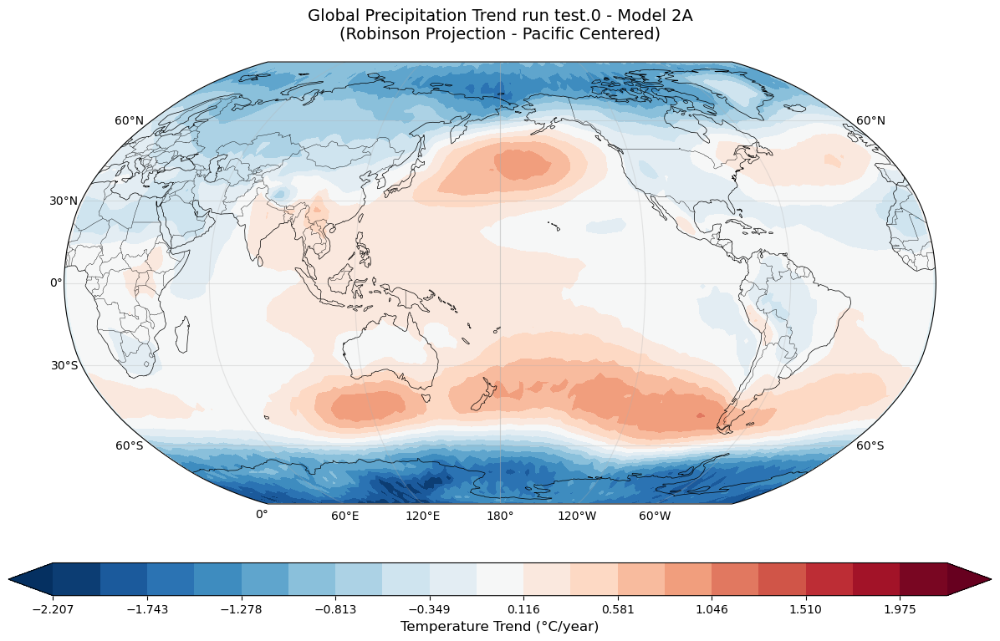

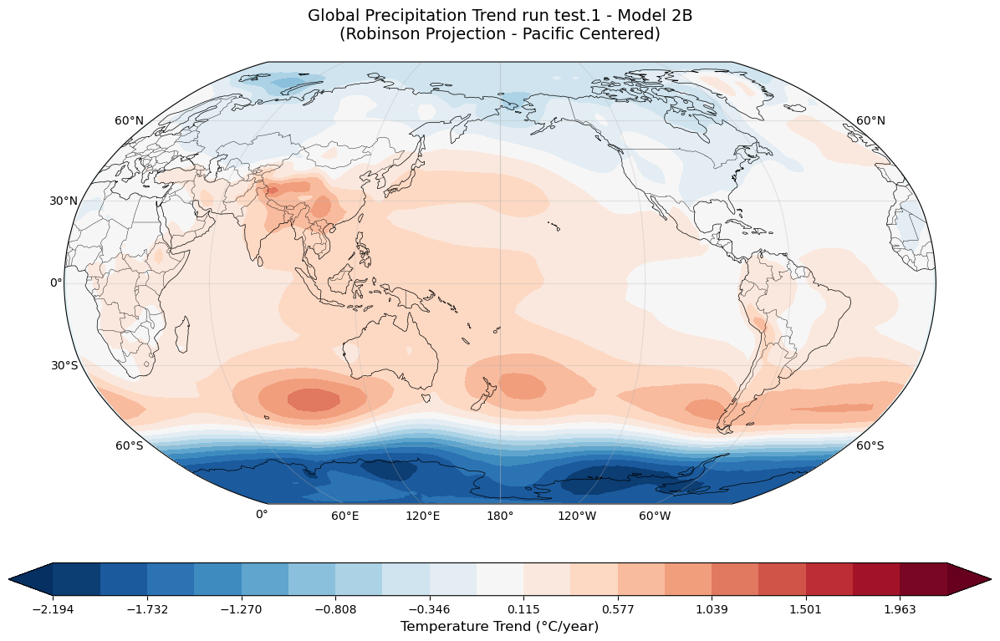

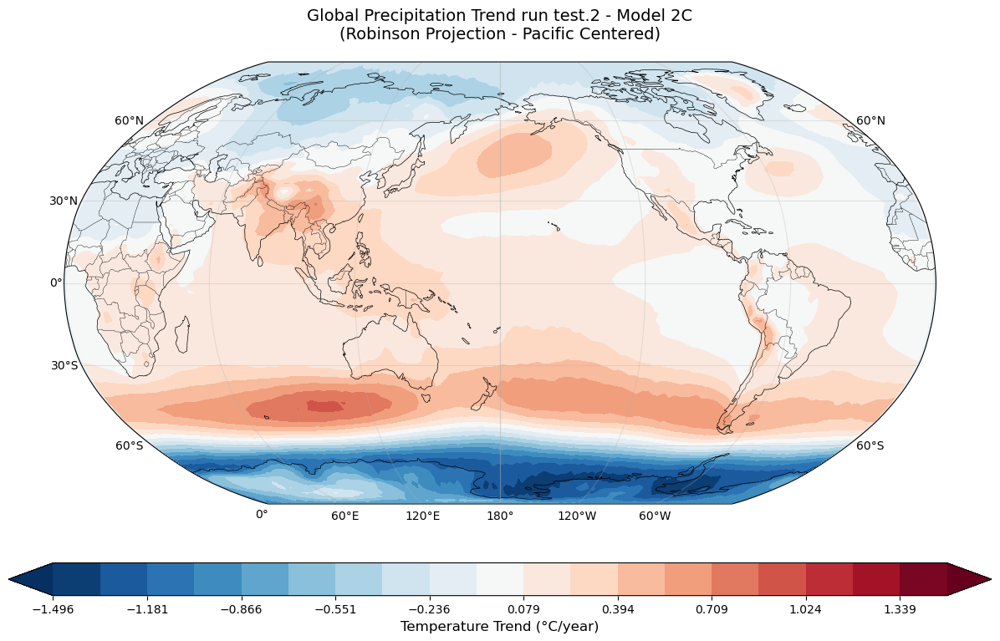

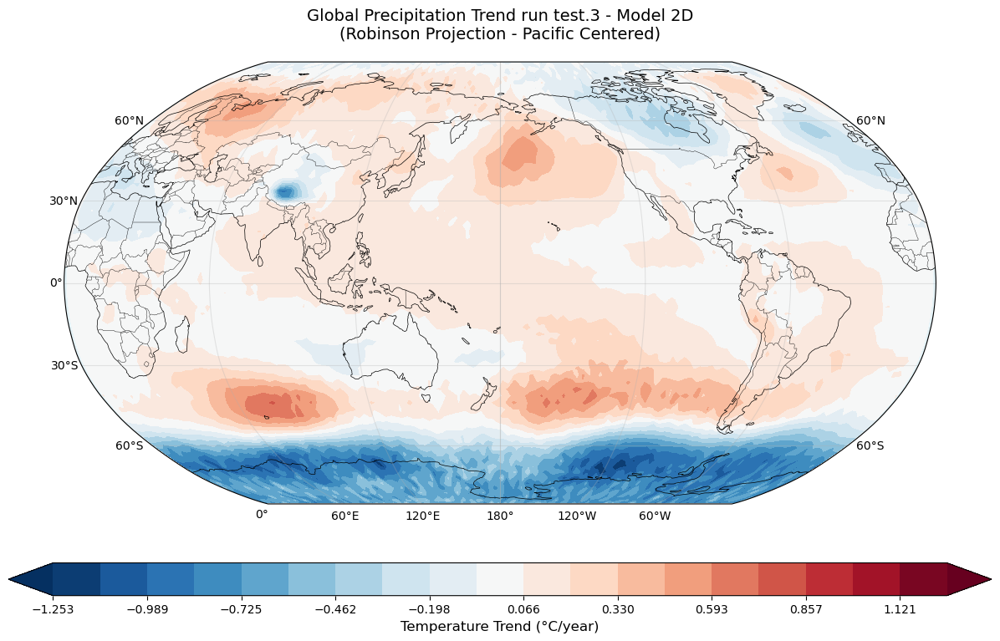

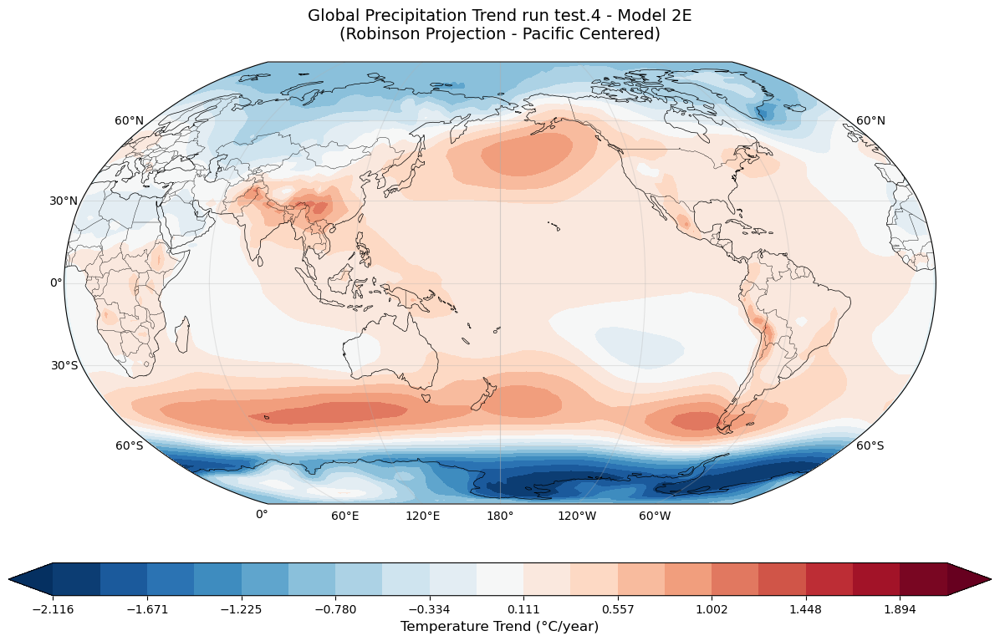

...

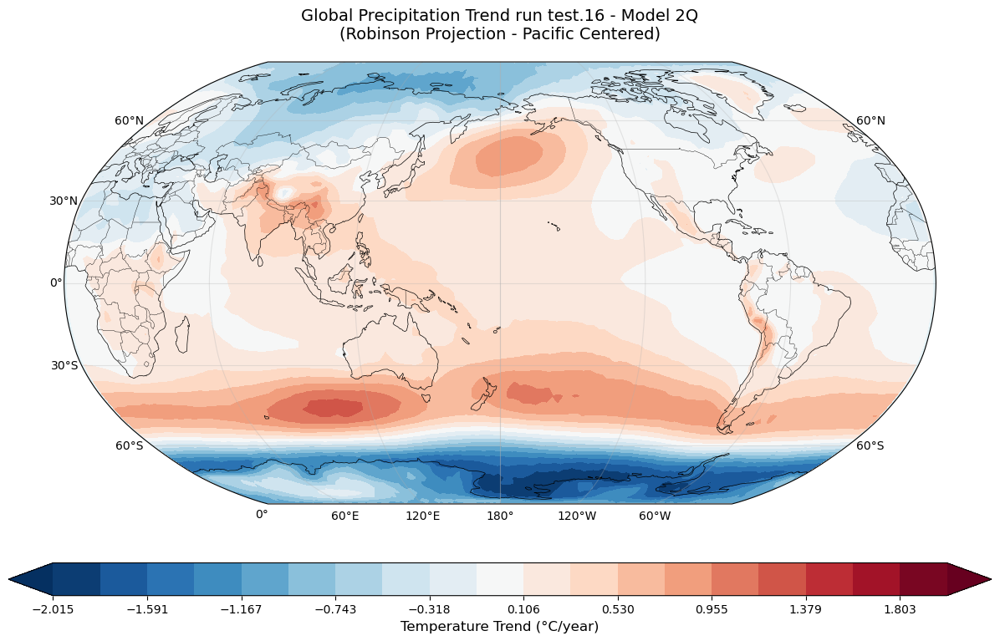

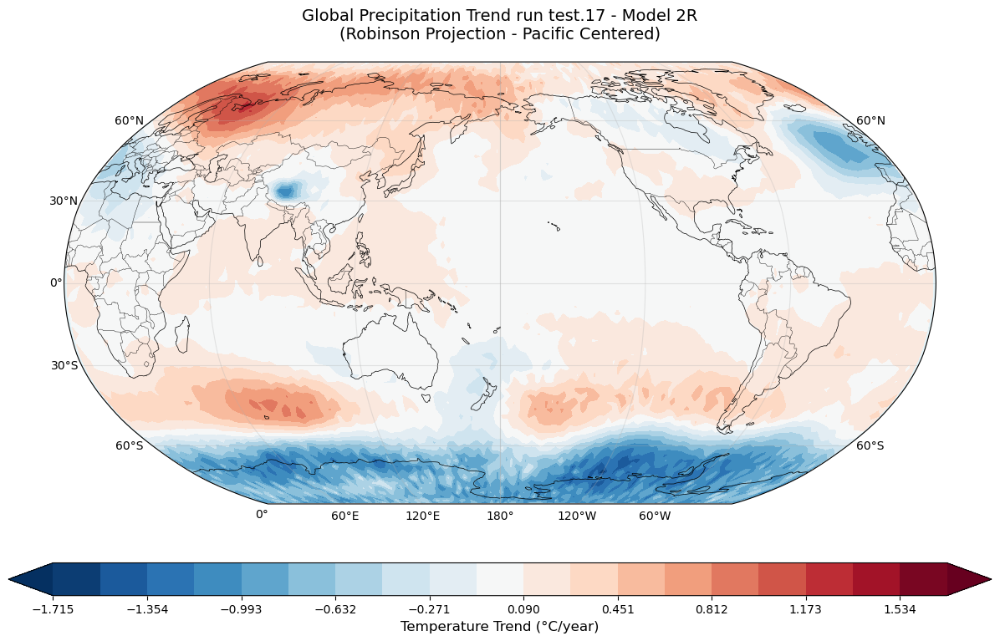

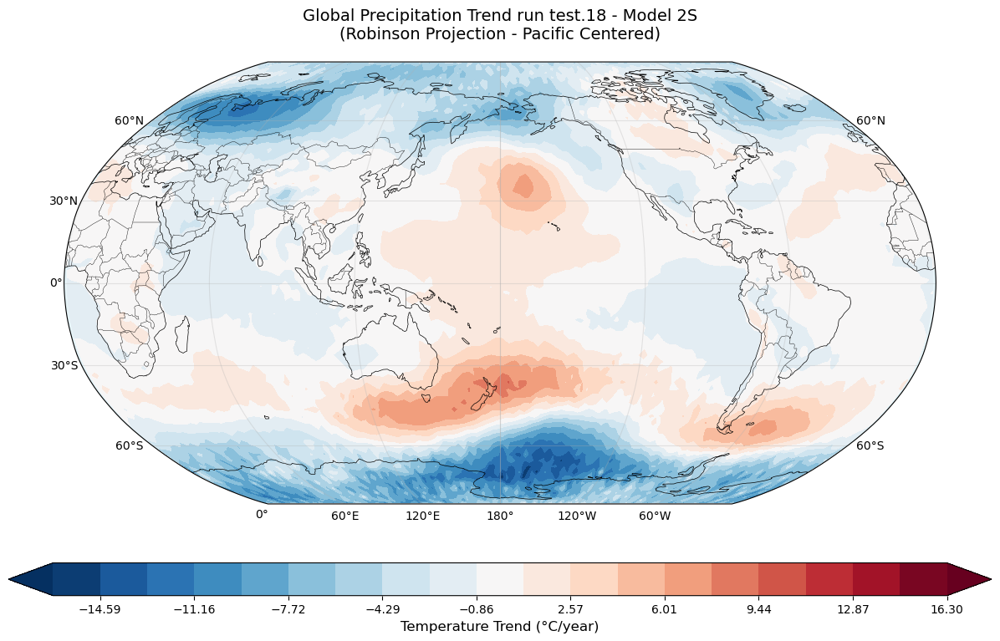

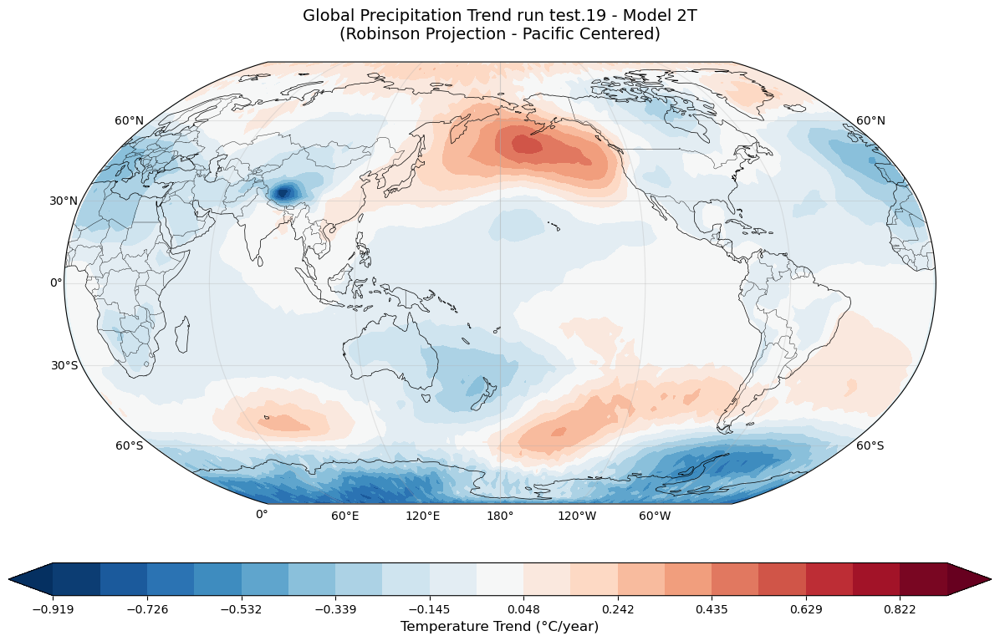

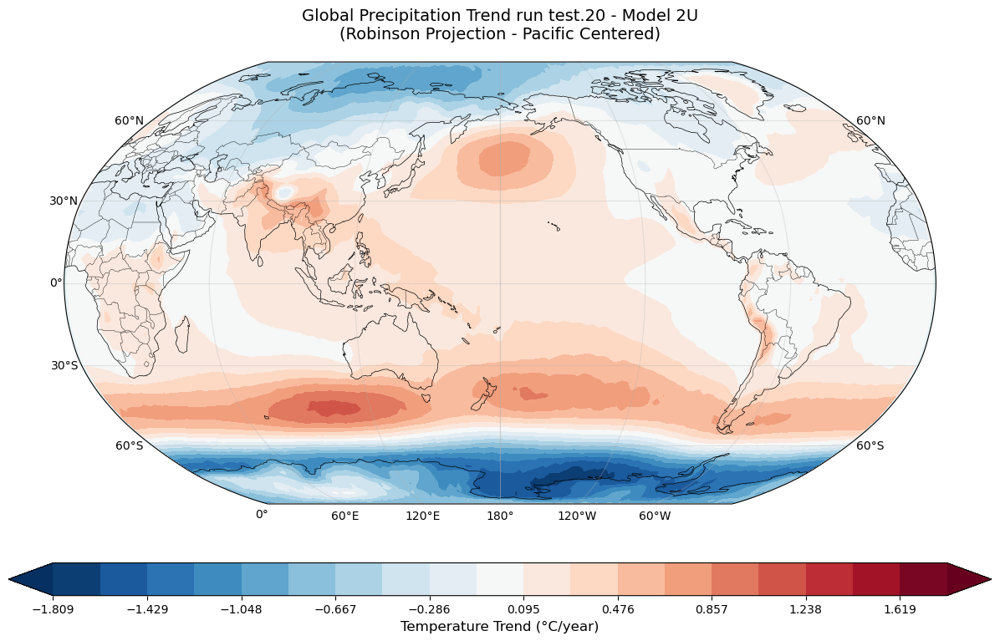

In [ ]:
for idx_run in range(trends_ridge_smooth_fullmap.shape[0]):
    fig = visualizer.plot_robinson_projection(trends_ridge_fullmap, 
                                    title="Global Precipitation Trend run test.{}".format(idx_run),
                                    cmap='RdBu_r',
                                    run_idx=idx_run,
                                    central_longitude=180)